<a href="https://colab.research.google.com/github/SitiZumarohdf/02_praktikum_web_lanjut/blob/master/UTS_PCVK_Rina(13)_Zuma(16).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive 

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib .pyplot as plt
import numpy as np
import math
import os
import glob 
from PIL import Image as im

 ## Menambahkan shape pada citra

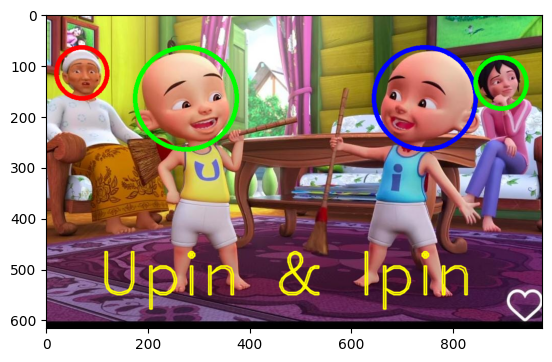

In [ ]:
img_shape = cv.imread('/content/drive/MyDrive/PCVK/Image/Upin Ipin.jpeg')
img_rgb = cv.cvtColor(img_shape, cv.COLOR_BGR2RGB)
cv.circle(img_rgb, center=(70,115), radius=50, color=(255,0,0), thickness=8) #(lebar(kolom),tinggi(baris))
cv.circle(img_rgb, center=(275,165), radius=100, color=(0,255,0), thickness=8)
cv.circle(img_rgb, center=(745,165), radius=100, color=(0,0,255), thickness=8)
cv.circle(img_rgb, center=(895,135), radius=50, color=(0,255,0), thickness=8)
font = cv.FONT_HERSHEY_DUPLEX
cv.putText(img_rgb,text="Upin & Ipin",org=(100,550),fontFace=font,fontScale=4,color=(255,255,0),thickness=2,lineType=cv.LINE_AA)
plt.imshow(img_rgb)

## **Operasi Citra Sederhana**

Transformasi Linier Brightness

Mengubah tingkat kecerahan citra
--------------------------------
masukkan nilai kecerahan : 30


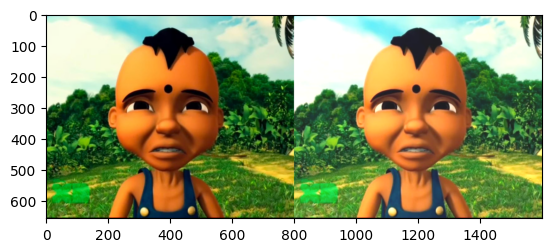

In [ ]:
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try :
  brightness = int(input('masukkan nilai kecerahan : '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Image/Raju2.jpg')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
brightness_image = np.zeros(img_rgb.shape, original.dtype)

#akses per piksel
for y in range(img_rgb.shape[0]):
  for x in range(img_rgb.shape[1]):
    for c in range(img_rgb.shape[2]):
      brightness_image[y,x,c] = np.clip(img_rgb[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((img_rgb, brightness_image))
plt.imshow(final_frame)

transformasi logarithmic brightness

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------
Masukkan nilai kecerahan: 30


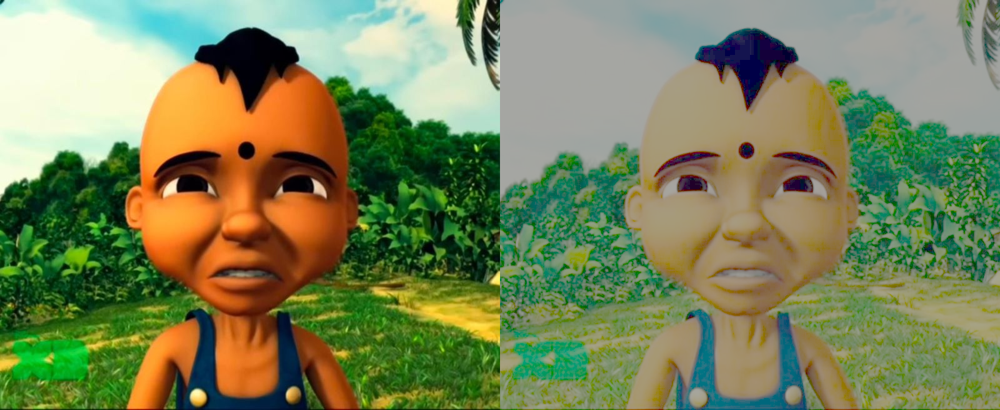

In [ ]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('--------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Eror, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Image/Raju2.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
      for c in range(original.shape[2]):
        brightness_image[y,x,c] = np.clip(brightness * (np.log(1 + original[y,x,c])), 0, 255)
       

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## **Gamma Correction**

 Gamma Correction pada citra 
-------------------------------
Masukkan nilai Gamma: 4


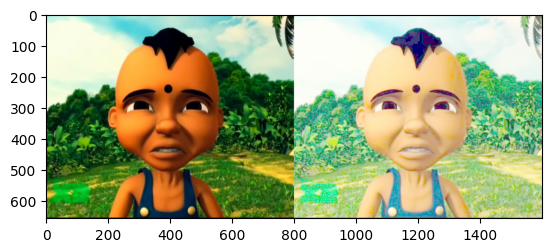

In [ ]:
# Mengubah Gamma Correction
print(' Gamma Correction pada citra ')
print('-------------------------------')
# fungsi try except digunakan untuk autentikasi bahwa yg dimasukkan harus angka, tdk boleh string
try: 
 gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Image/Raju2.jpg')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
gamma_image = np.zeros(img_rgb.shape, img_rgb.dtype)

# for y adalah lebar
for y in range(img_rgb.shape[0]):
  # for x adalah tinggi
  for x in range(img_rgb.shape[1]):
    # for c adalah chanel warna
    for c in range(img_rgb.shape[2]):
      gamma_image[y,x,c] = np.clip(255 * pow  (img_rgb[y,x,c] / 255, (1 / gamma)), 0, 255)

final_frame = cv.hconcat((img_rgb, gamma_image))
plt.imshow(final_frame)

## Image Depth

 Simulasi Image Depth  
--------------------------
Masukkan nilai Bit Depth: 2


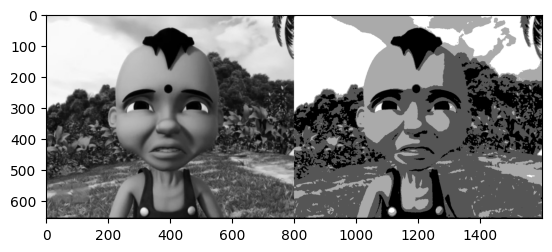

In [ ]:
# Membuat simulasi image Depth
print(' Simulasi Image Depth  ')
print('--------------------------')
try:
  bd = float(input('Masukkan nilai Bit Depth: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/Raju1.jpg', cv.IMREAD_GRAYSCALE)
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
depth_image = np.zeros(img_rgb.shape, original.dtype)

bit = 2**bd
level = 255 / (bit - 1)

for y in range(img_rgb.shape[0]):
  for x in range(img_rgb.shape[1]):
     depth_image[y,x] = np.clip(round(original[y,x] / level) * level, 0, 255);

final_frame = cv.hconcat((img_rgb, depth_image))
plt.imshow(final_frame)
     

## PNSR

Nilai PSNR adalah None (dB)


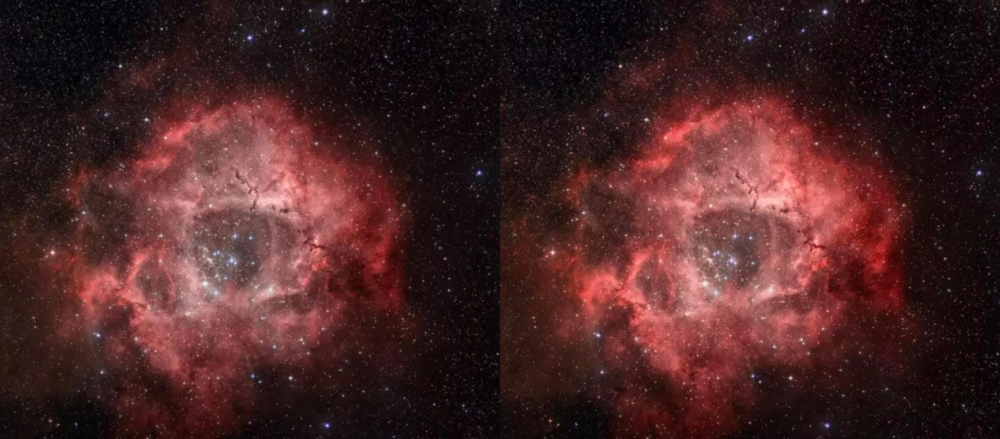

In [ ]:
# Membuat Average Denoising

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/PCVK/Image/Nebula.jpeg')
cv_img = [] 
for img in glob.glob('/content/drive/MyDrive/PCVK/Image/Noises3/*.jpeg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0] #inisialisasi 
noise_number = 4 #jumlah img yang akan di proses
for i in range(noise_number): #looping dimana jika i = 0 maka akan dilewati dengan perintah pass 
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0) ##addWeight = pengabungan

def PSNR(original, compressed): 
  mse = np.mean((original - compressed)**2) 
  if(mse == 0):  
    return 10
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 37.788452797669464 (dB)


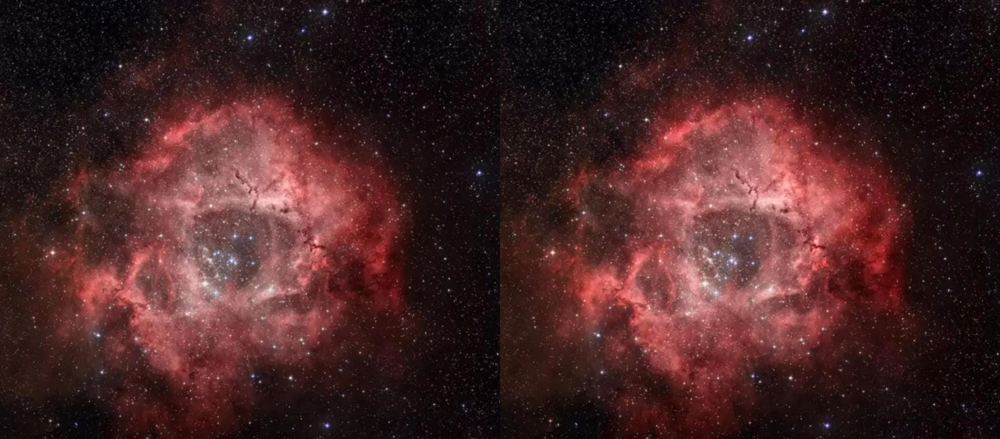

In [ ]:
# Jumlah Citra di Average - 5
dst = cv_img[0]
noise_number = 8
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed): 
    mse = np.mean((original - compressed) ** 2) 
    if(mse == 0):  
      return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

## Average Denoising

Nilai PSNR Average 8 adalah 35.64204790494776 (dB)


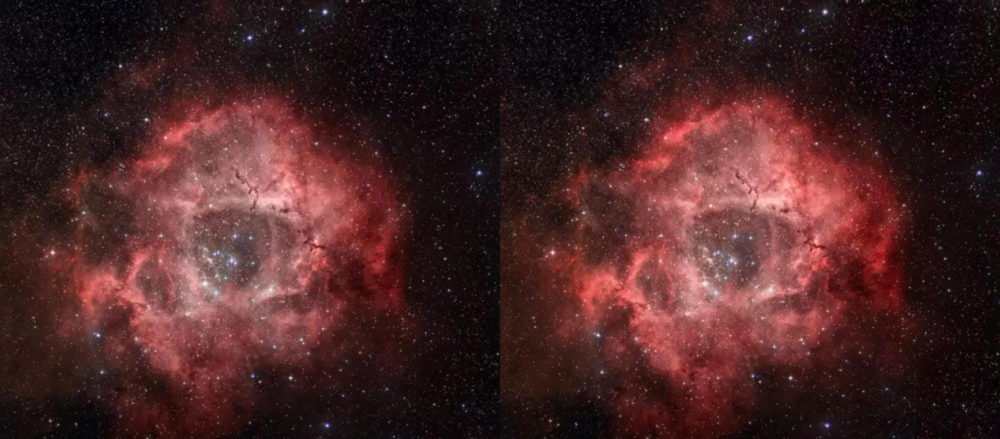

In [ ]:
# 3. Jumlah Citra di Average - 60

dst = cv_img[0]
noise_number = 5
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed): 
    mse = np.mean((original - compressed) ** 2) 
    if(mse == 0):  
      return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR Average 8 adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

## Operasi Aritmatika (Image Masking)

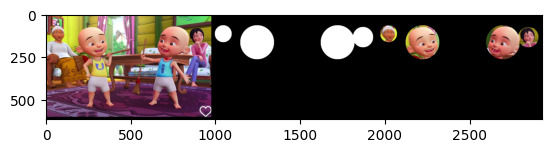

In [ ]:
# Operator AND 
img_org =cv.imread('/content/drive/MyDrive/PCVK/Image/Upin Ipin.jpeg')
img_org = cv.cvtColor(img_org,cv.COLOR_RGB2BGR) # ini namanya konversi

#img_org = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (70,115), 50, (255,255,255), -1)
mask1 = cv.circle(mask, (270,165), 100, (255,255,255), -1)
mask2 = cv.circle(mask, (745,165), 100, (255,255,255), -1)
mask3 = cv.circle(mask, (895,135), 60, (255,255,255), -1)
result = img_org & mask & mask1 & mask2 & mask3

org_frame = cv.hconcat((img_org, mask, result))
plt.imshow(org_frame)

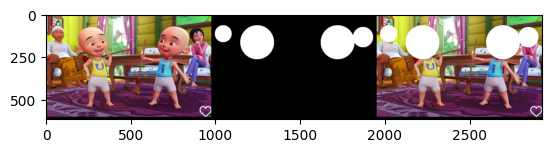

In [ ]:
# Operator OR 
img_org =cv.imread('/content/drive/MyDrive/PCVK/Image/Upin Ipin.jpeg')
img_org = cv.cvtColor(img_org,cv.COLOR_RGB2BGR) # ini namanya konversi

#img_org = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (70,115), 50, (255,255,255), -1)
mask1 = cv.circle(mask, (270,165), 100, (255,255,255), -1)
mask2 = cv.circle(mask, (745,165), 100, (255,255,255), -1)
mask3 = cv.circle(mask, (895,135), 60, (255,255,255), -1)
result = img_org | mask | mask1 | mask2 | mask3

org_frame = cv.hconcat((img_org, mask, result))
plt.imshow(org_frame)
     


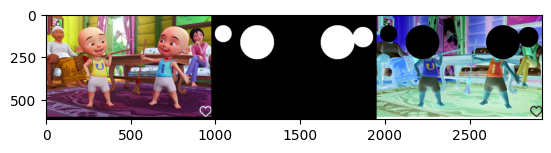

In [ ]:
# Operator NOT 
img_org =cv.imread('/content/drive/MyDrive/PCVK/Image/Upin Ipin.jpeg')
img_org = cv.cvtColor(img_org,cv.COLOR_RGB2BGR) # ini namanya konversi

#img_org = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (70,115), 50, (255,255,255), -1)
mask1 = cv.circle(mask, (270,165), 100, (255,255,255), -1)
mask2 = cv.circle(mask, (745,165), 100, (255,255,255), -1)
mask3 = cv.circle(mask, (895,135), 60, (255,255,255), -1)
result = ~img_org & ~mask & ~mask1 & ~mask2 & ~mask3

org_frame = cv.hconcat((img_org, mask, result))
plt.imshow(org_frame)

## Histogram

<BarContainer object of 256 artists>

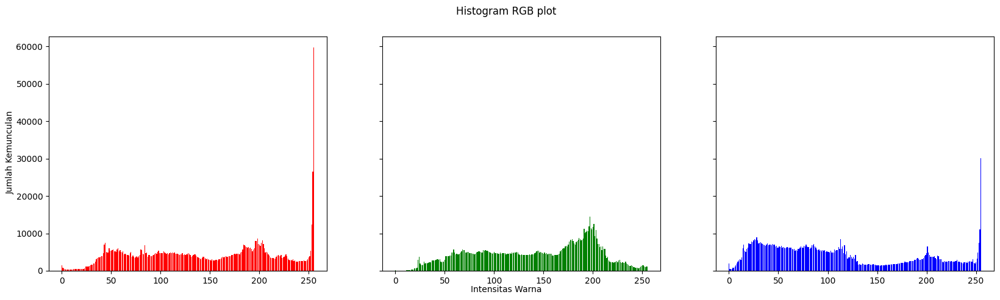

In [ ]:
image  = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg') #read gambar lena dengan menggunakan pustaka dari opencv
height, width, depth = np.shape(image) #menetukan lebar, tinggi, kedalaman
names = np.arange(256) #array dengan 256 elemen dengan nilai dari 0-255

b = [0]*256 #array yang mempresentasikan jumlah kemunculan intensitas piksel yang berbeda untuk warna b,g,r
g = [0]*256
r = [0]*256

for y in range (0,height) : #perulangan untuk lebar dan tinggi
  for x in range (0,width) :
    b[image[y][x][0]] += 1  #index array b ditentukan oleh nilai intensitas warna b,g,r dengan indeks array 0-255
    g[image[y][x][1]] += 1
    r[image[y][x][2]] += 1

names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=[20,5], sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, r, color = 'red')
axs[1].bar(names, g, color = 'green')
axs[2].bar(names, b, color = 'blue')
 

## Histogram Equalization

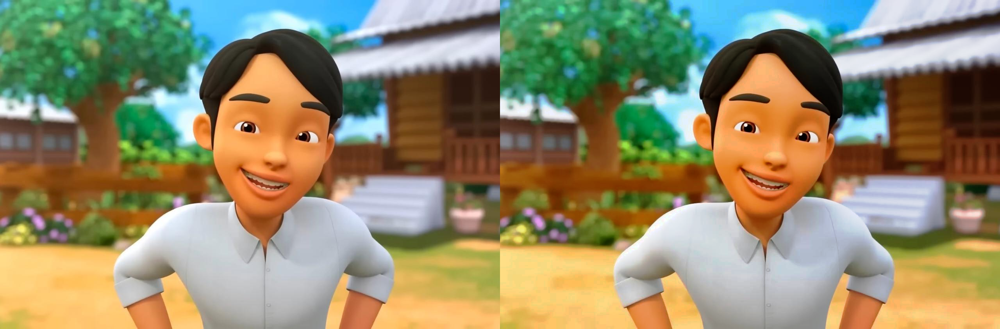

<BarContainer object of 256 artists>

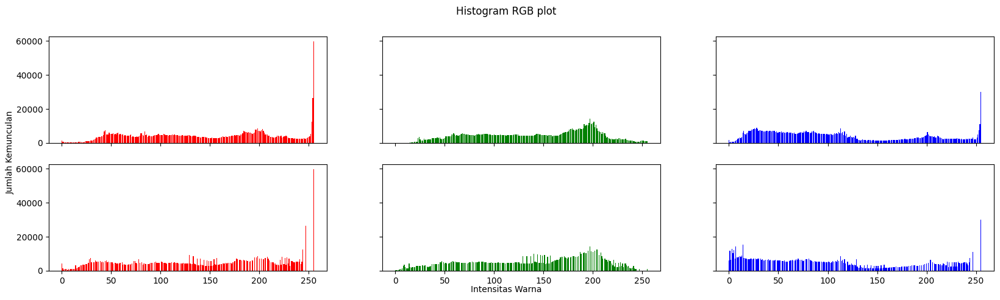

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg') 
height, width, depth = np.shape(img)
names = np.arange(256)

blue = [0]*256
green = [0]*256
red = [0]*256

def histog(img):

  height, width, depth = np.shape(img) 

  ax = np.zeros((3,256)) 
  for y in range(0,height) : 
    for x in range(0,width) :
      ax[0][img[y][x][0]] += 1 
      ax[1][img[y][x][1]] += 1
      ax[2][img[y][x][2]] += 1 
  return ax

histo_asli = histog(img)

# Menconvert ke Numpy array
img_array = np.asarray(img)

# Normalized cumulative histogram
# Flatten image array and calculate histogram dg binning
histogram_array = np.bincount(img_array.flatten(), minlength=256)

num_pixels = np. sum(histogram_array) 
histogram_array = histogram_array/num_pixels

chistogram_array = np.cumsum(histogram_array)

# Pixel mapping lookup table
transform_map = np.floor(255 * chistogram_array). astype (np.uint8)

# flatten image array into 10 list 
img_list = list(img_array.flatten())

# transform pixel values to equalize 
eq_img_list = [transform_map[p] for p in img_list]

# reshape and write back into img_array
eq_img_array = np.reshape(np.asarray(eq_img_list), img_array.shape) 
img2 = eq_img_array

equal_histo = histog(img2)

final_frame = cv.hconcat((img, img2)) 
cv2_imshow(final_frame)

names = np.arange (256) 
fig, axs = plt.subplots(2, 3, figsize=[20,5], sharex=True, sharey=True) 
fig.suptitle('Histogram RGB plot') 
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical') 
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center') 
axs[0,0].bar(names, histo_asli[2], color='red') 
axs[0,1].bar(names, histo_asli[1], color='green') 
axs[0,2].bar(names, histo_asli[0], color='blue') 
axs[1,0].bar(names, equal_histo[2], color='red') 
axs[1,1].bar(names, equal_histo[1], color='green')
axs[1,2].bar(names, equal_histo[0], color='blue')

## Dithering

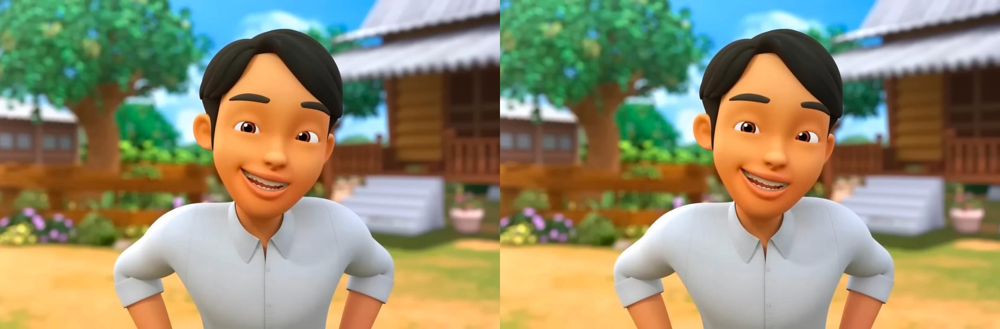

In [ ]:
from PIL import Image
imageConvert = Image.open('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg').convert(mode='RGB', dither=Image.FLOYDSTEINBERG)
imageConvert.save('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg')


ImageOriginal = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg')


ImageDithered = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg')


final_frame = cv.hconcat((ImageOriginal, ImageDithered))
cv2_imshow(final_frame)


Menampilkan Image Green-Blue

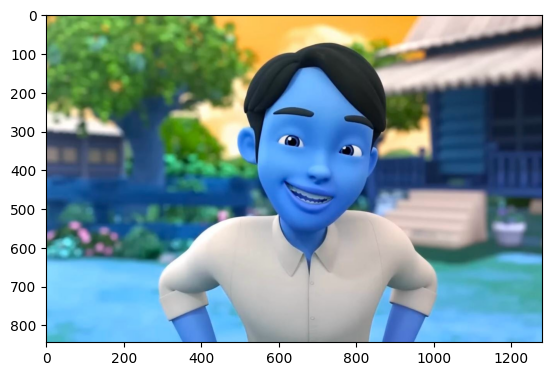

In [ ]:
#Green-Blue
img_gb = cv.imread('/content/drive/MyDrive/PCVK/Images/Abang is.jpg')
#r,g,b = cv.split(img_gb)
img_convert = cv.cvtColor(img_gb, cv.COLOR_BGR2RGB)
img_gb[:,:,:0] = 0
plt.imshow(img_gb)
plt.show()


#menggabungkan channel green dan blue
#img_gb = cv.merge([g,b,g])
#plt.imshow(img_gb)
#plt.show()

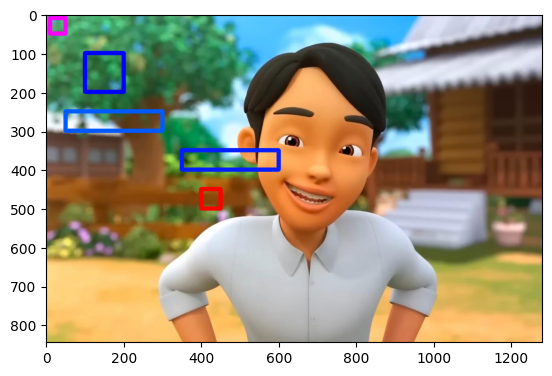

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

cv.rectangle(img,pt1=(10,10),pt2=(50,50),color=(255,0,255),thickness=10)
cv.rectangle(img,pt1=(100,100),pt2=(200,200),color=(0,1,255),thickness=10)
cv.rectangle(img,pt1=(50,250),pt2=(300,300),color=(0,90,255),thickness=10)
cv.rectangle(img,pt1=(600,400),pt2=(350,350),color=(5,30,255),thickness=10)
cv.rectangle(img,pt1=(400,450),pt2=(450,500),color=(255,0,0),thickness=10)
plt.imshow(img)

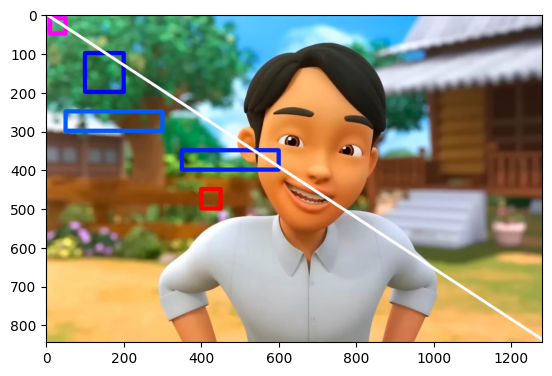

In [ ]:
cv.line(img,pt1=(0,0),pt2=(1300,850),color=(255,255,255),thickness=5)
#pt 1 = lebar dari 0-512
#pt 2 = tinggi 0-512
#thickness = ketebalan
plt.imshow(img)

## Filter Spasial

In [ ]:
def convolution2d(image, kernel, stride, padding):
  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1
#padding = menambahkan nilai pixel
#stride = pergeseran 
  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)
      
  return new_image

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/Image/Abang Is.jpeg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

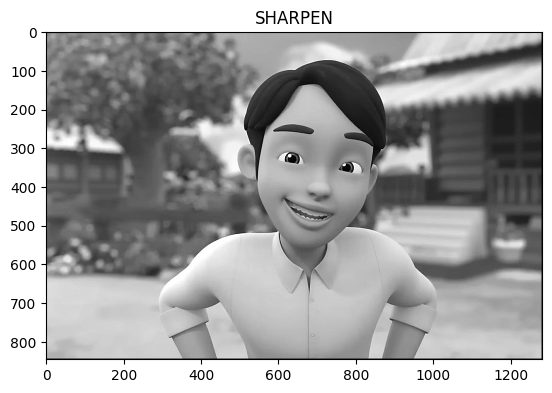

In [ ]:
# IMAGE SHARPEN 
kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
img_kernel_sharpen = img_gray.copy()
img_kernel_sharpen= convolution2d(img_gray,kernel_sharpen,1,2)

plt.title("SHARPEN")
plt.imshow(img_kernel_sharpen, cmap='gray',vmin=0, vmax=255)


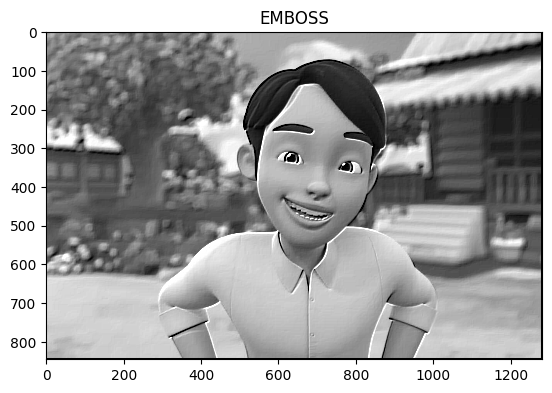

In [ ]:
# IMAGE EMBOSS 
kernel_embos = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                           [0, 1, 2]])
img_kernel_emboss = img_gray.copy()
img_kernel_emboss= convolution2d(img_gray,kernel_embos,1,2)

plt.title("EMBOSS")
plt.imshow(img_kernel_emboss, cmap='gray',vmin=0, vmax=255)

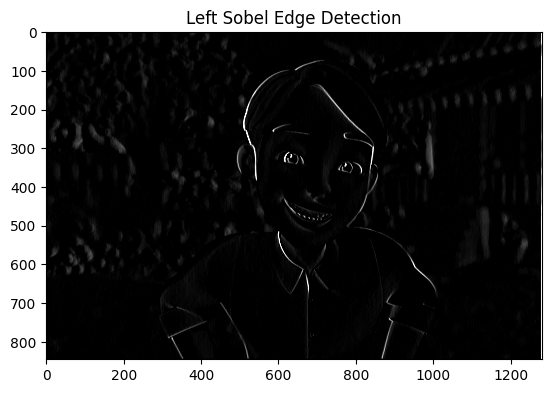

In [ ]:
# Left Sobel Edge Detection 
kernel_sobel = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])
img_kernel_sobel = img_gray.copy()
img_kernel_sobel = convolution2d(img_gray,kernel_sobel,1,2)

plt.title("Left Sobel Edge Detection")
plt.imshow(img_kernel_sobel, cmap='gray',vmin=0, vmax=255)

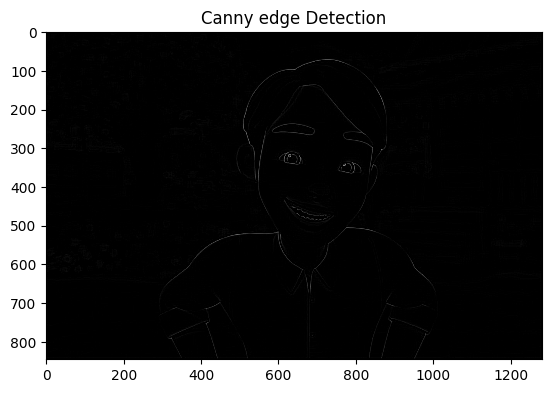

In [ ]:
# Canny edge Detection
kernel_Canny = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])
img_kernel_Canny = img_gray.copy()
img_kernel_Canny = convolution2d(img_gray,kernel_Canny,1,2)

plt.title("Canny edge Detection")
plt.imshow(img_kernel_Canny, cmap='gray',vmin=0, vmax=255)

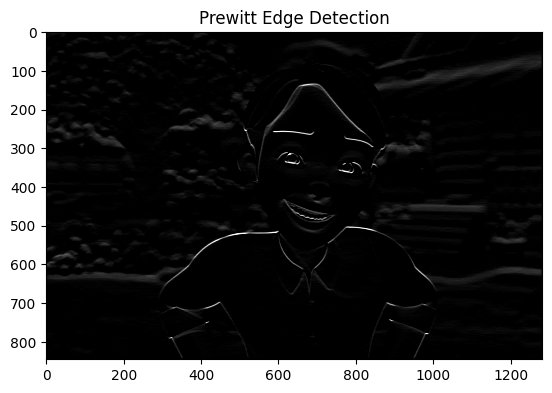

In [ ]:
#Prewitt Edge DetectioN
kernel_Prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
img_kernel_Prewitt = img_gray.copy()
img_kernel_Prewitt = convolution2d(img_gray,kernel_Prewitt,1,2)

plt.title("Prewitt Edge Detection")
plt.imshow(img_kernel_Prewitt, cmap='gray',vmin=0, vmax=255)

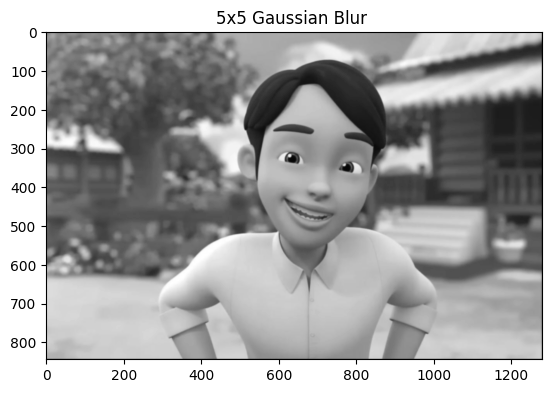

In [ ]:
#5x5 Gaussian Blur 
kernel_Gaussian_blur = np.array([[1,4,6,4,1],
                                 [4,16,24,16,4],
                                 [6,24,36,24,6],
                                 [4,16,24,16,4],
                                 [1,4,6,4,1]])* 1/256 
img_kernel_Gaussian_blur = img_gray.copy()
img_kernel_Gaussian_blur = convolution2d(img_gray,kernel_Gaussian_blur,1,2)

plt.title("5x5 Gaussian Blur ")
plt.imshow(img_kernel_Gaussian_blur, cmap='gray',vmin=0, vmax=255)

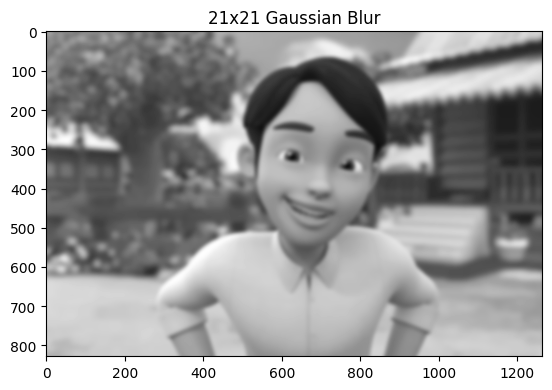

In [ ]:
# 21x21 Gaussian Blur
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

img = img_gray.copy()
img = convolution2d(img, gauss_kernel ,1,2)

plt.title("21x21 Gaussian Blur")
plt.imshow(img, cmap='gray',vmin=0, vmax=255)